## **Part 3:**
In part 2, we accomplished the following:
- Impute missing values
- Keep valid range

In part 3, we would do the following:
- Statitical tests for continuous variables
- Visualisations for continous variables


In [ ]:
import numpy as np
import pandas as pd
from sklearn.datasets import load_diabetes, load_iris
import seaborn as sns
import matplotlib.pyplot as plt
import scipy.stats as stats
from scipy.stats import levene, ttest_ind, f_oneway, kruskal, shapiro, kstest
import statsmodels.api as sm
from sklearn.preprocessing import MinMaxScaler

pd.set_option('display.max_rows', None)
pd.set_option('display.max_columns', None)

In [ ]:
import pandas as pd

# Read the data
df = pd.read_csv('/content/filtered_data.csv')
df_schema = pd.read_csv('/content/schema.csv')
df_schema.set_index('variable_name', inplace=True)
df_schema
df.shape

(18883, 70)

### **Data Modification**

Most frequently occuring value and the count

In [ ]:
# most frequently occuring value and the count
most_frequent_values = {}
for column in df.columns:
    most_common = df[column].value_counts().idxmax()
    count = df[column].value_counts().max()
    most_frequent_values[column] = {'value': most_common, 'count': count}

# DataFrame from the dictionary
result_df = pd.DataFrame(most_frequent_values).T

print(result_df)

                                           value   count
Hospital Mortality                             0   15866
Age                                           77     504
Gender                                         M   11457
Uncomplicated Hypertension                     0   10123
Complicated Hypertension                       0   17418
Uncomplicated Diabetes                         0   14980
Complicated Diabetes                           0   17924
Malignancy                                     0   16871
Hematologic Disease                            0   16070
Metastasis                                     0   18055
Peripheral Vascular Disease                    0   17244
Hypothyroidism                                 0   17307
Chronic Heart Failure                          0   14348
Stroke                                         0   17825
Liver Disease                                  0   17085
SAPS II                                       34     692
SOFA                           

#### **Find Missing values**

Number of Missing values by Columns

In [ ]:
# missing values column-wise
na_count = df.isnull().sum() # total count
na_pct = (na_count/len(df))*100 # percentage

na_df = pd.DataFrame({'Count': na_count.values,
                      'Percentage (%)': na_pct}).reset_index().rename(columns = {'index': 'Feature'})

na_df.sort_values(by='Percentage (%)', ascending=False)

,Feature,Count,Percentage (%)
49,Mean Lactate,5101,27.013716
48,Min Lactate,5101,27.013716
47,Max Lactate,5101,27.013716
50,Max pH,1173,6.211937
51,Min pH,1173,6.211937
52,Mean pH,1173,6.211937
44,Max Temperature,687,3.638193
45,Min Temperature,687,3.638193
46,Mean Temperature,687,3.638193
68,Ventilation Duration (h),497,2.631997


Number of missing values by rows

In [ ]:
temp_df = df.copy()
# Calculate missing values by row
missing_values_by_row = df.isnull().sum(axis=1)

# Add the missing values count to the original DataFrame
temp_df["MissingValuesCount"] = missing_values_by_row

total_rows = len(temp_df)
temp_df["MissingValuesPercentage"] = (temp_df["MissingValuesCount"] / total_rows) * 100

# Sort the DataFrame by the "MissingValuesCount" column in descending order
df_sorted = temp_df.sort_values(by="MissingValuesPercentage", ascending=False)

# Print the sorted DataFrame
print(df_sorted[['MissingValuesCount','MissingValuesPercentage']].head(100))

       MissingValuesCount  MissingValuesPercentage
6766                   36                 0.190648
11565                  36                 0.190648
960                    36                 0.190648
6480                   36                 0.190648
8888                   27                 0.142986
8750                   25                 0.132394
1794                   24                 0.127098
4749                   24                 0.127098
4900                   24                 0.127098
13876                  24                 0.127098
13534                  24                 0.127098
10804                  24                 0.127098
4171                   24                 0.127098
1682                   22                 0.116507
4219                   22                 0.116507
1509                   22                 0.116507
8097                   22                 0.116507
11525                  22                 0.116507
15573                  22      

#### **Remove Missing Values**
- In the codes below, we are checking the missing values per group of variables.
- We have the rows counts towards the right with number of missing values towardsleft(1-5) and their respective percentages.

In [ ]:
before_clear_mv = df.shape
print(f'Before clean missing values, the dataset has {before_clear_mv[0]} rows and {before_clear_mv[1]} variables')

Before clean missing values, the dataset has 18883 rows and 70 variables


In [ ]:
# drop the columns RRT and Ventilation Duration (h) in df
df_orig = df.copy()
df = df.drop(['RRT', 'Ventilation Duration (h)'], axis=1)

In [ ]:
def calculate_missing_percentages(df):
    df_copy = df.copy()  # Create a copy of the DataFrame
    missing_percentages = df_copy.isna().sum(axis=1) / len(df.columns) * 100
    missing_percentages = missing_percentages.round(2)

    # Create a new column to store the percentage of missing values
    df_copy['missing_percentage'] = missing_percentages

    # Group the DataFrame by the 'missing_percentage' column and count the number of observations in each group
    counts = df_copy.groupby('missing_percentage').size().reset_index(name='count')

    # Sort the table by percentage from highest to lowest
    counts = counts.sort_values(by='missing_percentage', ascending=False)

    # Print the table
    print(counts)

In [ ]:
dem_f = df_schema[df_schema['category'] == 'Demographic'].index
medical_f = df_schema[df_schema['category'] == 'Medical history'].index
severe_f = df_schema[df_schema['category'] == 'Disease severity'].index
diag_f = df_schema[df_schema['category'] == 'Diagnosis'].index
vital_f = df_schema[df_schema['category'] == 'Vital signs'].index
lab_f = df_schema[df_schema['category'] == 'Laboratory results'].index

dem_df = df[dem_f]
medical_df = df[medical_f]
severe_df = df[severe_f]
diag_df = df[diag_f]
vital_df = df[vital_f]
lab_df = df[lab_f]


In [ ]:
print('Demographic')
print(calculate_missing_percentages(dem_df))
print('-----------------------------')
print()
print('Medical history')
print(calculate_missing_percentages(medical_df))
print('-----------------------------')
print()
print('Disease severity')
print(calculate_missing_percentages(severe_df))
print('-----------------------------')
print()
print('Diagnosis')
print(calculate_missing_percentages(diag_df))
print('-----------------------------')
print()
print('Vital signs')
print(calculate_missing_percentages(vital_df))
print('-----------------------------')
print()
print('Laboratory results')
print(calculate_missing_percentages(lab_df))

Demographic
   missing_percentage  count
0                 0.0  18883
None
-----------------------------

Medical history
   missing_percentage  count
0                 0.0  18883
None
-----------------------------

Disease severity
   missing_percentage  count
0                 0.0  18883
None
-----------------------------

Diagnosis
   missing_percentage  count
0                 0.0  18883
None
-----------------------------

Vital signs
   missing_percentage  count
4               100.0     41
3                60.0      1
2                40.0     18
1                20.0    647
0                 0.0  18176
None
-----------------------------

Laboratory results
   missing_percentage  count
7              100.00     50
6               85.71      9
5               71.43      6
4               57.14     15
3               42.86     28
2               28.57    968
1               14.29   4345
0                0.00  13462
None


- Based on the above analysis, we removed all the rows that had missing values for vital signs and Laboratory features.

In [ ]:
# removing missing values from Vital features
df.dropna(subset=['Max Heart Rate', 'Min Heart Rate', 'Mean Heart Rate',
                  'Max MAP', 'Min MAP', 'Mean MAP',
                  'Max Systolic Pressure', 'Min Systolic Pressure', 'Mean Systolic Pressure',
                  'Max Diastolic Pressure', 'Min Diastolic Pressure', 'Mean Diastolic Pressure',
                  'Max Temperature', 'Min Temperature', 'Mean Temperature'],
          inplace=True)

In [ ]:
df.shape

(18176, 68)

In [ ]:
# removing missing values from laboratory features
df.dropna(subset=['Max Lactate', 'Min Lactate', 'Mean Lactate',
                    'Max pH', 'Min pH', 'Mean pH',
                    'Max Glucose', 'Min Glucose', 'Mean Glucose',
                    'Max WBC', 'Min WBC', 'Mean WBC',
                    'Max BUN', 'Min BUN', 'Mean BUN',
                    'Max Creatinine', 'Min Creatinine', 'Mean Creatinine',
                    'Max Hemoglobin', 'Min Hemoglobin', 'Mean Hemoglobin'],
          inplace=True)

In [ ]:
after_clean_missing_values = df.shape

#### After Clear up missing values

In [ ]:
print(f'Before clean missing values, the dataset has {before_clear_mv[0]} rows and {before_clear_mv[1]} variables')
print(f'After clean missing values, the dataset has {after_clean_missing_values[0]} rows and {after_clean_missing_values[1]} variables')

Before clean missing values, the dataset has 18883 rows and 70 variables
After clean missing values, the dataset has 12799 rows and 68 variables


#### **Valid Range**

Make sure all variables are within valid range

In [ ]:
df = df.loc[
    ((df['Max Heart Rate'] >= 0) & (df['Max Heart Rate'] <= 350))
    & ((df['Min Heart Rate'] >= 0) & (df['Max Heart Rate'] <= 350))
    & ((df['Mean Heart Rate'] >= 0) & (df['Mean Heart Rate'] <= 350))
    & ((df['Max MAP']  >= 14) & (df['Max MAP'] <= 330))
    & ((df['Min MAP']  >= 14) & (df['Min MAP'] <= 330))
    & ((df['Mean MAP']  >= 14) & (df['Mean MAP'] <= 330))
    & ((df['Min Systolic Pressure'] >= 0) & (df['Min Systolic Pressure'] <= 375))
    & ((df['Max Systolic Pressure'] >= 0) & (df['Max Systolic Pressure'] <= 375))
    & ((df['Mean Systolic Pressure'] >= 0) & (df['Mean Systolic Pressure'] <= 375))
    & ((df['Min Diastolic Pressure'] >= 0) & (df['Min Diastolic Pressure'] <= 375))
    & ((df['Max Diastolic Pressure'] >= 0) & (df['Max Diastolic Pressure'] <= 375))
    & ((df['Mean Diastolic Pressure'] >= 0) & (df['Mean Diastolic Pressure'] <= 375))
    & ((df['Min Temperature'] >= 26)& (df['Min Temperature'] <= 45))
    & ((df['Max Temperature'] >= 26)& (df['Max Temperature'] <= 45))
    & ((df['Mean Temperature'] >= 26)& (df['Mean Temperature'] <= 45))
    & ((df['Min pH']  >= 0)& (df['Min pH'] <= 14))
    & ((df['Max pH']  >= 0)& (df['Max pH'] <= 14))
    & ((df['Mean pH']  >= 0)& (df['Mean pH'] <= 14))
    & ((df['Min Lactate']  >= 0.4)& (df['Min Lactate'] <= 30))
    & ((df['Max Lactate']  >= 0.4)& (df['Max Lactate'] <= 30))
    & ((df['Mean Lactate']  >= 0.4)& (df['Mean Lactate'] <= 30))
    & ((df['Min Glucose'] >= 33)& (df['Min Glucose'] <= 2000))
    & ((df['Max Glucose'] >= 33)& (df['Max Glucose'] <= 2000))
    & ((df['Mean Glucose'] >= 33)& (df['Mean Glucose'] <= 2000))
    & ((df['Min WBC'] >= 0)& (df['Min WBC'] <= 1000))
    & ((df['Max WBC'] >= 0)& (df['Max WBC'] <= 1000))
    & ((df['Mean WBC'] >= 0)& (df['Mean WBC'] <= 1000))
    & ((df['Min BUN'] >= 0)& (df['Min BUN'] <= 250))
    & ((df['Max BUN'] >= 0)& (df['Max BUN'] <= 250))
    & ((df['Mean BUN'] >= 0)& (df['Mean BUN'] <= 250))
    & ((df['Min Creatinine'] >= 0.1)& (df['Min Creatinine'] <= 60))
    & ((df['Max Creatinine'] >= 0.1)& (df['Max Creatinine'] <= 60))
    & ((df['Mean Creatinine'] >= 0.1)& (df['Mean Creatinine'] <= 60))
    & ((df['Min Hemoglobin'] >= 0) & (df['Min Hemoglobin'] <= 25))
    & ((df['Max Hemoglobin'] >= 0) & (df['Max Hemoglobin'] <= 25))
    & ((df['Mean Hemoglobin'] >= 0) & (df['Mean Hemoglobin'] <= 25))
]

we removed around ~300 rows after appying valid ranges

In [ ]:
print(df['Hospital Mortality'].value_counts())

0    10331
1     2158
Name: Hospital Mortality, dtype: int64


In [ ]:
df.shape

(12489, 68)

### **Create Subsets**

In [ ]:
binary = df_schema[((df_schema['variable_type'] == 'binary') | (df_schema.index == 'Hospital Mortality')) & (df_schema.index != 'RRT')].index
ordinal = df_schema[((df_schema['variable_type'] == 'ordinal') | (df_schema.index == 'Hospital Mortality'))].index
cont_all = df_schema[((df_schema['variable_type'] == 'continuous') | (df_schema.index == 'Hospital Mortality')) & (df_schema['category'] != 'Treatment')].index

print("Length of Binary Variables:", len(binary))
print("Length of Ordinal Variables:", len(ordinal))
print("Length of Continuous Variables:", len(cont_all))


Length of Binary Variables: 28
Length of Ordinal Variables: 4
Length of Continuous Variables: 38


In [ ]:
cont_all_df = df[cont_all]
binary_df = df[binary]
ordinal_df = df[ordinal]

.**Quantitative variables can be further classified into:**

- ***Continuous variables:*** Also known as ratio variables. These are units of
measurement that can be represented in quantities less than 1. For instance, 0.8 km.

- ***Discrete or integer variables:*** Units that cannot be divided, such as 1 car or 1 tree.

- **Interval:**Variables that do not have a true zero (or it's arbitrary), or that zero value of that variable doesn't make sense. For example - IQ. Zero IQ doesn't mean anything. At the same time, person with IQ of 100 does not mean being twice as sharp to person with IQ of 50.
These variables have equal distance between values.

- **Ratio/Count:**Variables where zero value makes sense. For example - number of apples, 0 apples means nothing, while having 10 apples mean having twice as many as having 5 apples.
These variables have an intrinsic order with equal distance between values, howsoever small.

**Categorical variables are divided into the following variables:**

- ***Binary:*** Data that has one of two outcomes, such as yes/no or pass/fail.

- ***Nominal***: Used to describe data with no intrinsic order, such as brands, families, species.

- **Ordinal**: *italicized text* For ordered data types with observable scales of hierarchy, such as user ratings.

**Informal Rules:**

- Ordinal: Nominal + Order
- Interval: Order + Equal distance between values
- Ratio: Interval + True Zero

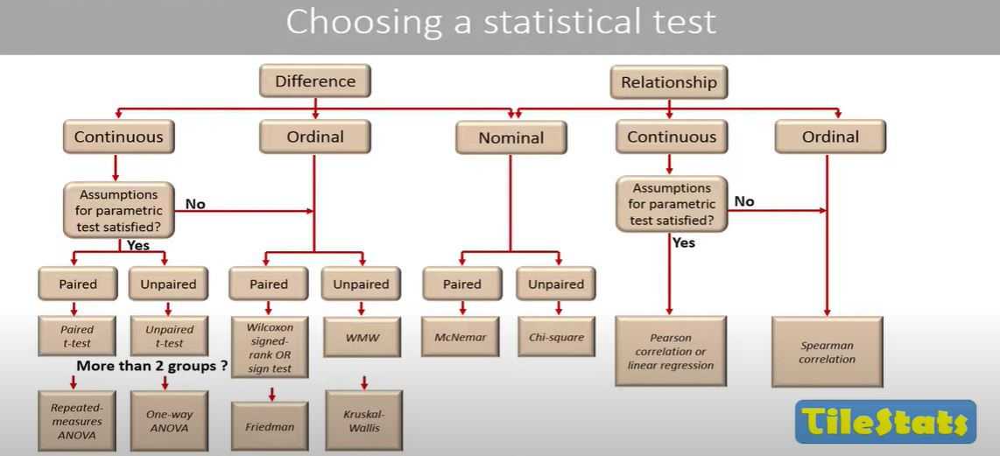

### **Continous Variables: Whether Parametric tests or Non-Parametric tests?**

Assumptions for Parametric Tests:
- **Independence of observations:** The separate observations (each variable entry) are unrelated to one another (for instance, repeating the same test on a single patient generates non-independent measurements, that is, repeated measurements).

- **Normality of data:** The data follows a normal distribution. This assumption is required only for quantitative data. (For more details, see also here)

- **Homogeneity of variance:** Each group being compared has a similar variance (i.e., the distribution, or “spread,” of scores around the mean). The “power” of the test to detect differences will be diminished if one group has significantly greater variation than the others.


####**Normality Tests- validate the Gaussian distribution of data.**

**Tests of equality of distributions:**

- **Shapiro-Wilk Test for normality**
- **Kolmogorov-Smirnov Test (KS-Test) of goodness of fit**
- **Q-Q plots**

##### **Shapiro-Wilk Test**
- Tests whether a data sample has a Gaussian distribution.
- **Assumption-**
  - Observations in each sample are independent and distributed identically.
- **Hypothesis**
  - H0: the sample has a Gaussian distribution.
  - H1: the sample does not have a Gaussian distribution.

In [ ]:
# Perform Shapiro-Wilk test on each column in cont_all_df: continuous variables
for column in cont_all_df.columns[1:]:
    stat, p = stats.shapiro(cont_all_df[column])
    print(f"Shapiro-Wilk test for {column}:")
    print(f"  Statistic: {stat}")
    print(f"  p-value: {p}")
    print("")

    if p < 0.05:
        print(f"The {column} does not follow normal distribution")
        print("---------------------------------------------------------------------")
    else:
        print(f"The {column}follows normal distribution")
        print("---------------------------------------------------------------------")

Shapiro-Wilk test for Age:
  Statistic: 0.9579778909683228
  p-value: 0.0

The Age does not follow normal distribution
---------------------------------------------------------------------
Shapiro-Wilk test for Max Heart Rate:
  Statistic: 0.9716181755065918
  p-value: 6.866362475191604e-44

The Max Heart Rate does not follow normal distribution
---------------------------------------------------------------------
Shapiro-Wilk test for Min Heart Rate:
  Statistic: 0.9904375672340393
  p-value: 4.8635451107712535e-28

The Min Heart Rate does not follow normal distribution
---------------------------------------------------------------------
Shapiro-Wilk test for Mean Heart Rate:
  Statistic: 0.9883667230606079
  p-value: 1.270662467504408e-30

The Mean Heart Rate does not follow normal distribution
---------------------------------------------------------------------
Shapiro-Wilk test for Max MAP:
  Statistic: 0.7134469747543335
  p-value: 0.0

The Max MAP does not follow normal distrib

/usr/local/lib/python3.10/dist-packages/scipy/stats/_morestats.py:1882: UserWarning: p-value may not be accurate for N > 5000.
  warnings.warn("p-value may not be accurate for N > 5000.")


**Limitations.**
-  Sensitivity in large samples: The Shapiro-Wilk test is highly sensitive to even small deviations from normality in large samples.
-  This means that as the sample size increases, the test becomes more likely to reject the null hypothesis of normality, even if the deviations from normality are very small.

**Observation:**
- Performed Shapiro Wilk test conducted on the dataset without missing values. The result for all variables is "not normally distributed."

##### **Quantile-Quantile plot:**

- Plots data quantiles against theoretical quantiles.
- It also highlights the skewness of distribution. If data quantiles are higher than theoretical quantiles i.e., the Q-Q plot lies above the Y=X line, the data is positively and right-skewed. Else, otherwise.
- If there is deviation from Y=X line while considering normal as theoretical distribution, that means the variable is not-normal

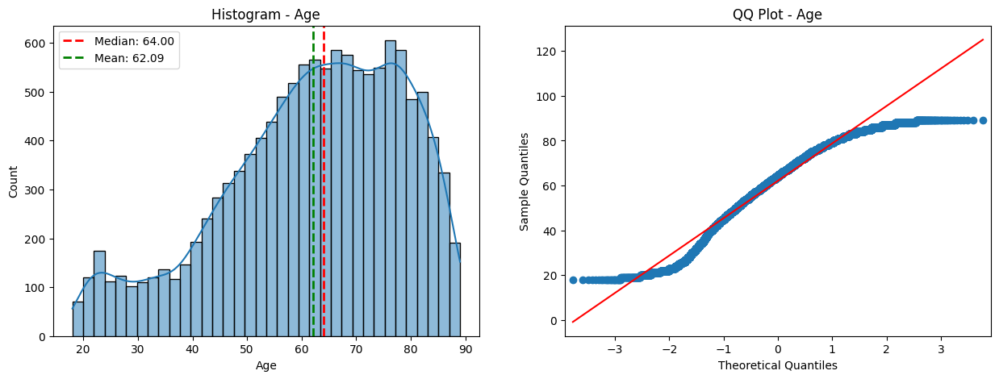

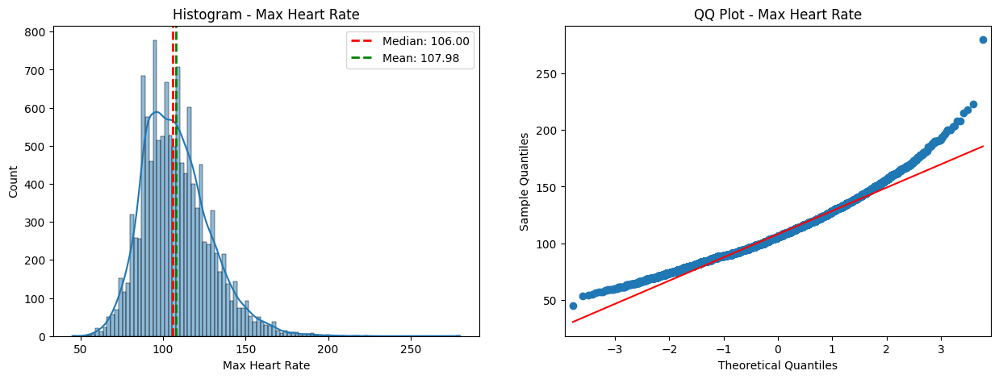

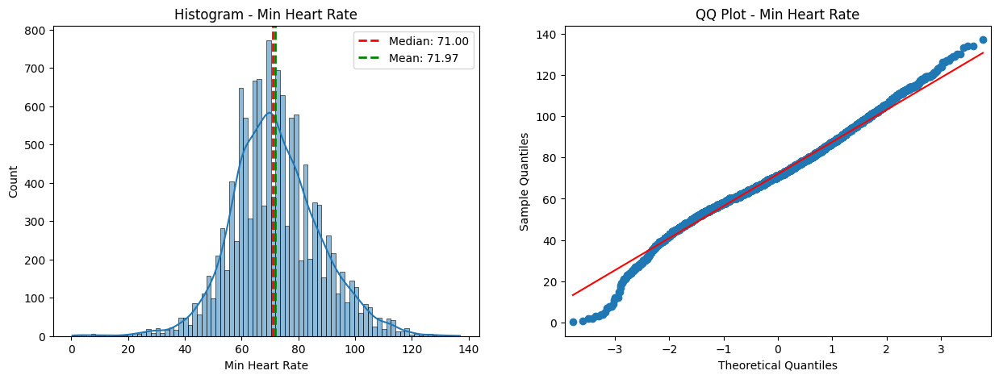

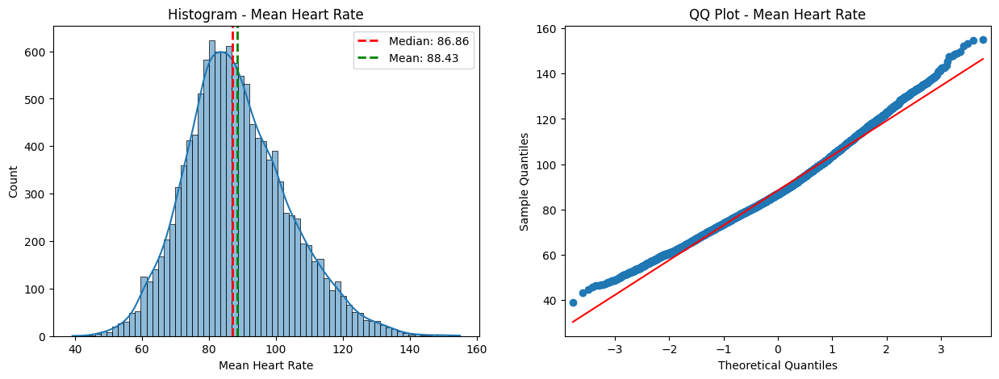

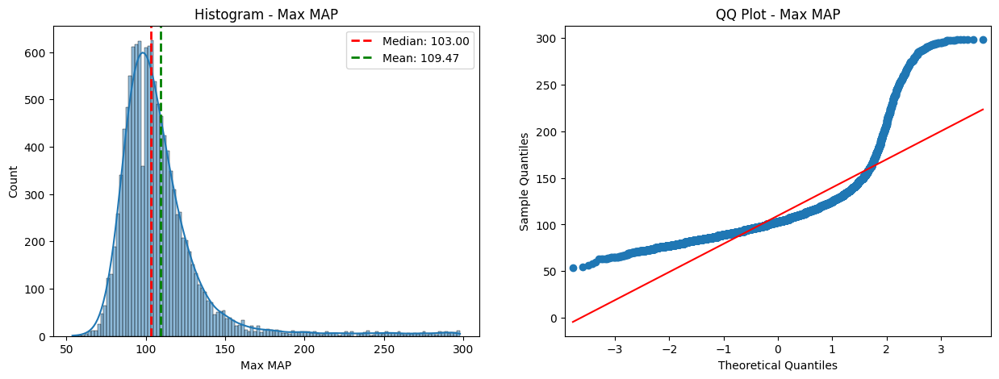

...

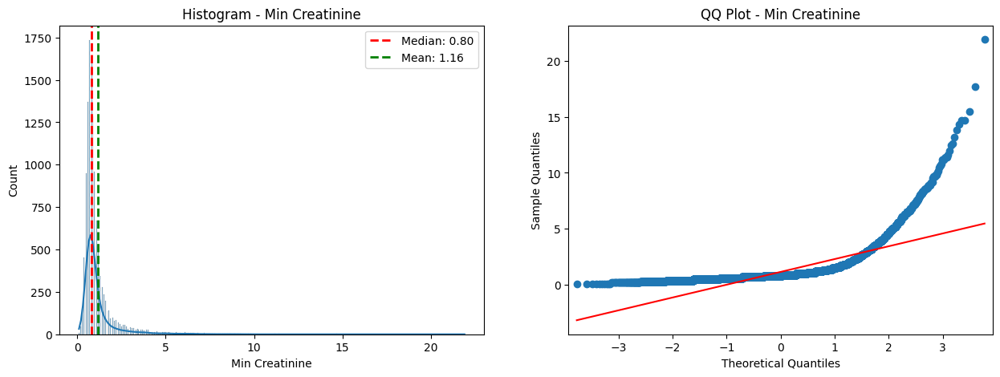

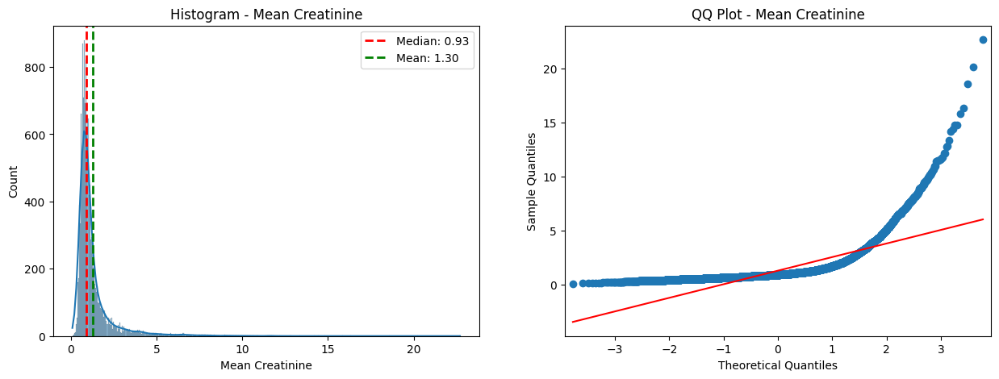

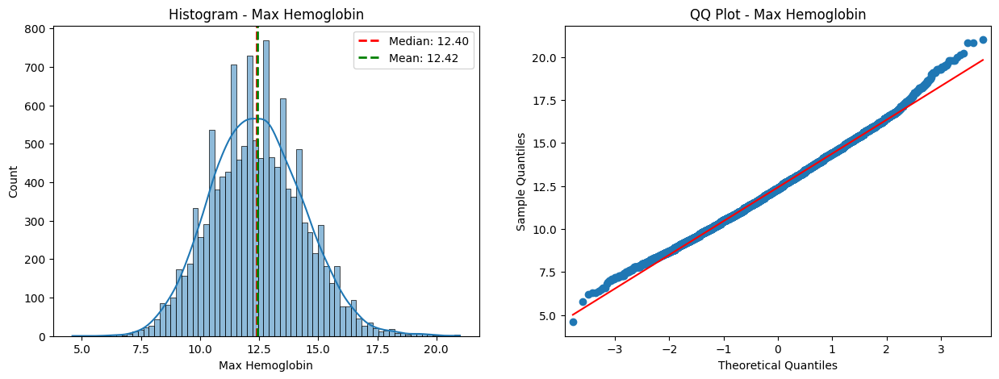

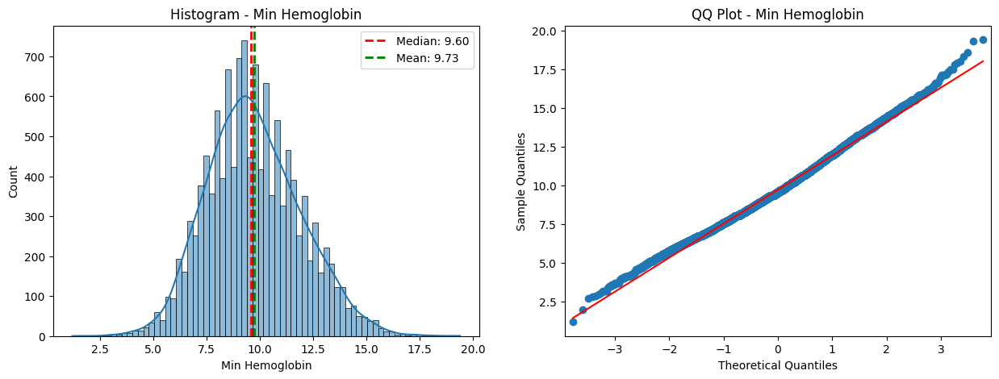

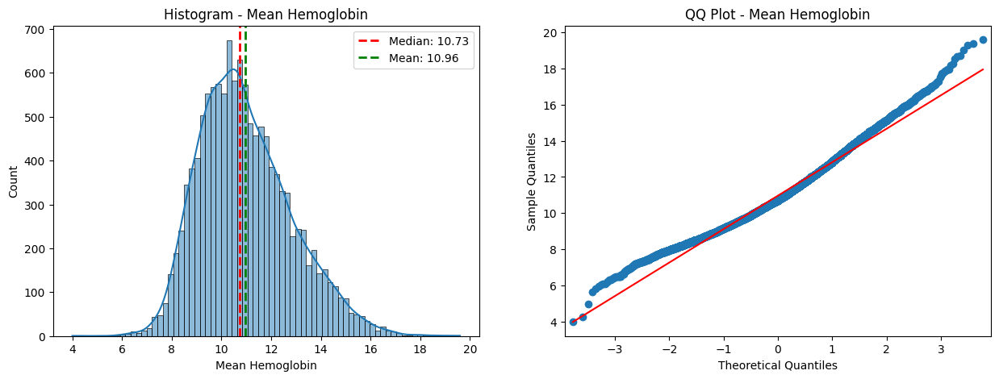

In [ ]:
# histogram and QQ plot for each column
def plot_histogram_qqplot(data, column):
    fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(15, 5))

    # Histogram with median and mean reference lines
    sns.histplot(data[column], kde=True, ax=axes[0])
    median_val = data[column].median()
    mean_val = data[column].mean()
    axes[0].axvline(median_val, color='r', linestyle='dashed', linewidth=2, label=f'Median: {median_val:.2f}')
    axes[0].axvline(mean_val, color='g', linestyle='dashed', linewidth=2, label=f'Mean: {mean_val:.2f}')
    axes[0].set_title(f'Histogram - {column}')
    axes[0].legend()

    # QQ Plot
    sm.qqplot(data[column], line='s', ax=axes[1])
    axes[1].set_title(f'QQ Plot - {column}')

    plt.show()

# Iterate through columns and create plots
for column in cont_all_df.columns:
    if column != 'Hospital Mortality':
        plot_histogram_qqplot(cont_all_df, column)

**Observation:**


- Notice through visual inspection that the outliers are causing the shape to be skewed.

##### **Kolmogorov-Smirnov Test:**
- It can be used to check normality by comparing with normal distribution
- Max value of 1

In [ ]:
# Perform Shapiro-Wilk test on each column in cont_all_df: continuous variables
for column in cont_all_df.columns[1:]:
    stat, p = kstest(cont_all_df[column], "norm")
    print(f"Kolmogorov-Smirnov Test for {column}:")
    print(f"  Statistic: {stat}")
    print(f"  p-value: {p}")
    print("")

    if p < 0.05: # null hypothesis rejected
        print(f"The {column} does not follow normal distribution")
        print("---------------------------------------------------------------------")
    else: # null hypothesis failed to reject
        print(f"The {column}follows normal distribution")
        print("---------------------------------------------------------------------")

Kolmogorov-Smirnov Test for Age:
  Statistic: 1.0
  p-value: 0.0

The Age does not follow normal distribution
---------------------------------------------------------------------
Kolmogorov-Smirnov Test for Max Heart Rate:
  Statistic: 1.0
  p-value: 0.0

The Max Heart Rate does not follow normal distribution
---------------------------------------------------------------------
Kolmogorov-Smirnov Test for Min Heart Rate:
  Statistic: 0.9994879059861275
  p-value: 0.0

The Min Heart Rate does not follow normal distribution
---------------------------------------------------------------------
Kolmogorov-Smirnov Test for Mean Heart Rate:
  Statistic: 1.0
  p-value: 0.0

The Mean Heart Rate does not follow normal distribution
---------------------------------------------------------------------
Kolmogorov-Smirnov Test for Max MAP:
  Statistic: 1.0
  p-value: 0.0

The Max MAP does not follow normal distribution
---------------------------------------------------------------------
Kolmogoro

**Observation:**
- Performed Kolmogorov-Smirnov Test conducted on the dataset without missing values. The result for all variables is "not normally distributed."

From the above 3 tests, we can conclude that the data is not normally distributed. Lets transform the data and check if the skewness is improved.

### **Data Nomalization on Continuous variable**
- Since the continuous variables do not follow a normal distribution, we used four methods to normalize them as our purpose was to perform parametric tests on these variables.  

#### **Log Transformation Method**

In [ ]:
log_transformed_data = cont_all_df.copy()

for column in cont_all_df.columns:
    if column != 'Hospital Mortality':
        log_transformed_data[column] = np.log(cont_all_df[column] + 1)


print(log_transformed_data.head())

    Hospital Mortality       Age  Max Heart Rate  Min Heart Rate  \
0                    0  4.356709        5.129899        4.330733   
1                    1  3.761200        4.718499        4.418841   
2                    1  4.290459        4.663439        4.276666   
9                    1  4.290459        4.007333        3.891820   
13                   0  4.343805        4.867534        4.521789   

    Mean Heart Rate   Max MAP   Min MAP  Mean MAP  Max Systolic Pressure  \
0          4.725490  5.560682  3.713572  4.339808               5.384495   
1          4.537961  4.890349  4.219508  4.603669               5.384495   
2          4.463936  4.709530  4.304065  4.490881               5.111988   
9          3.955672  4.605170  4.158883  4.393499               4.990433   
13         4.668946  4.488636  3.995137  4.304065               4.744932   

    Min Systolic Pressure  Mean Systolic Pressure  Max Diastolic Pressure  \
0                4.174387                4.644006        

##### **Visualization after log tranformation method**

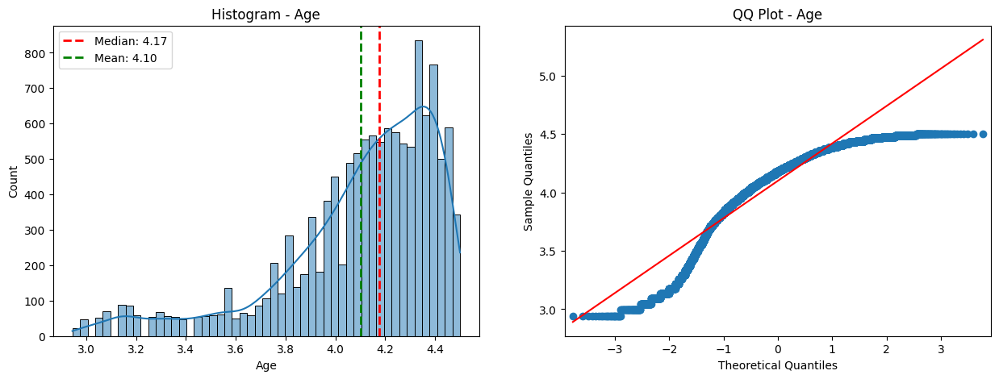

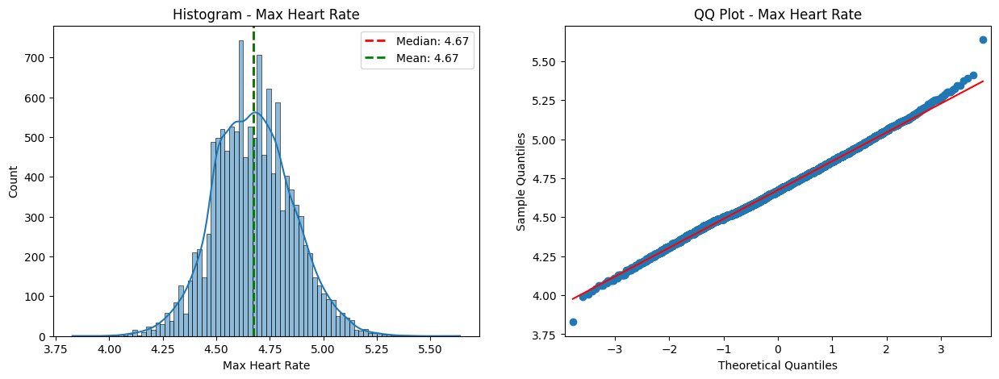

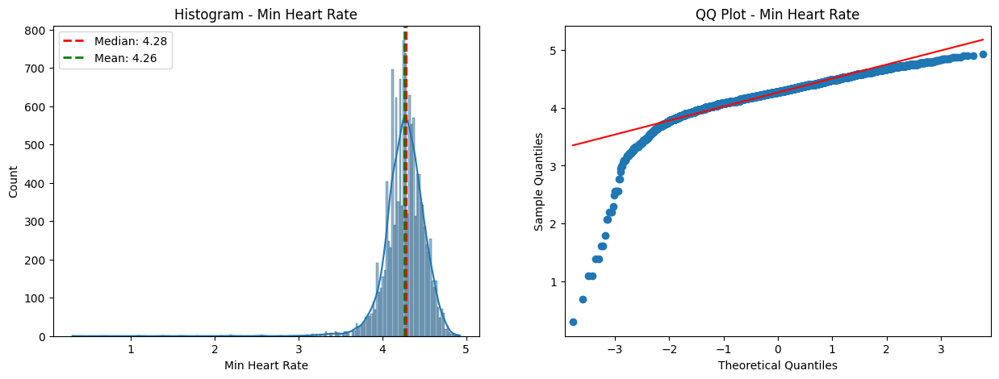

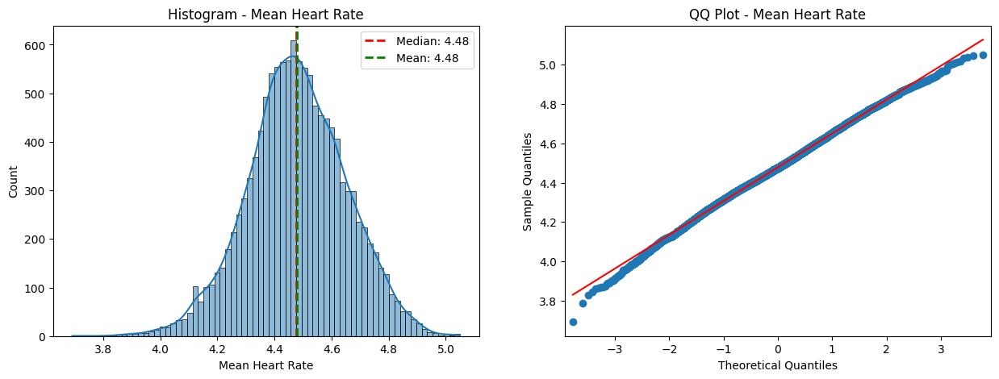

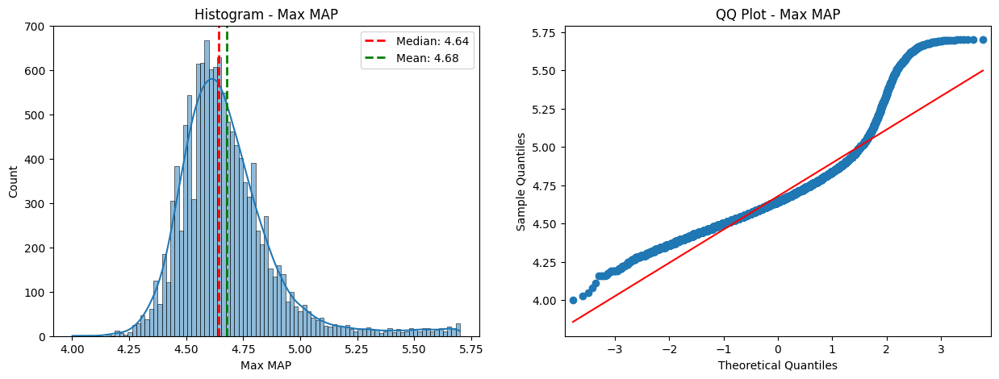

...

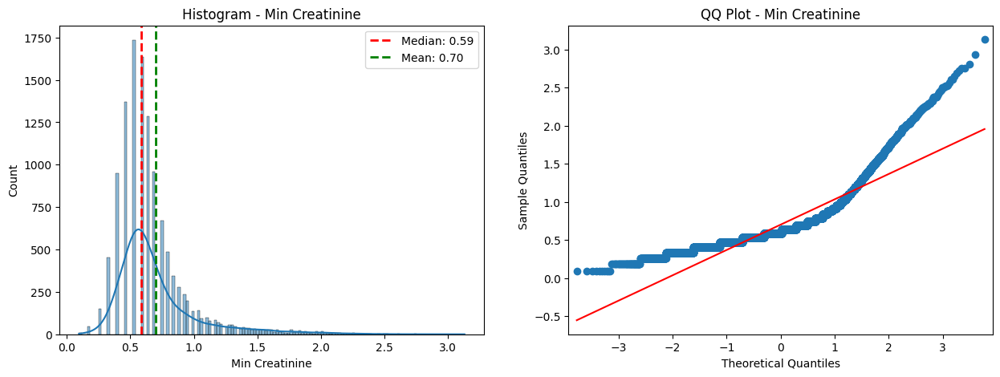

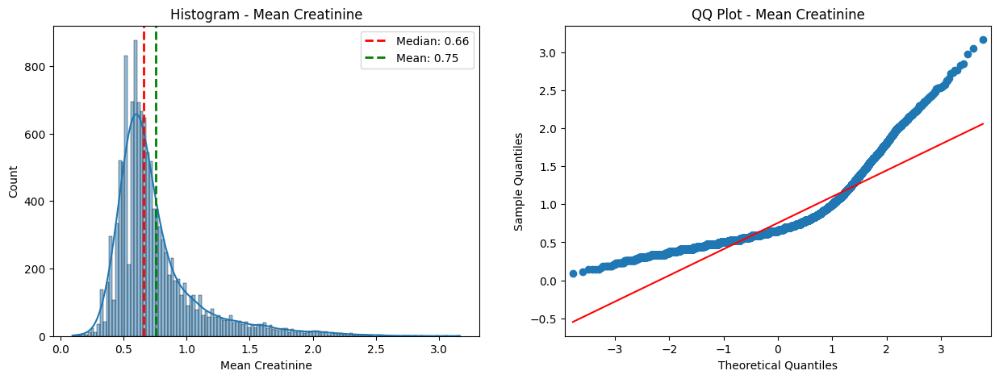

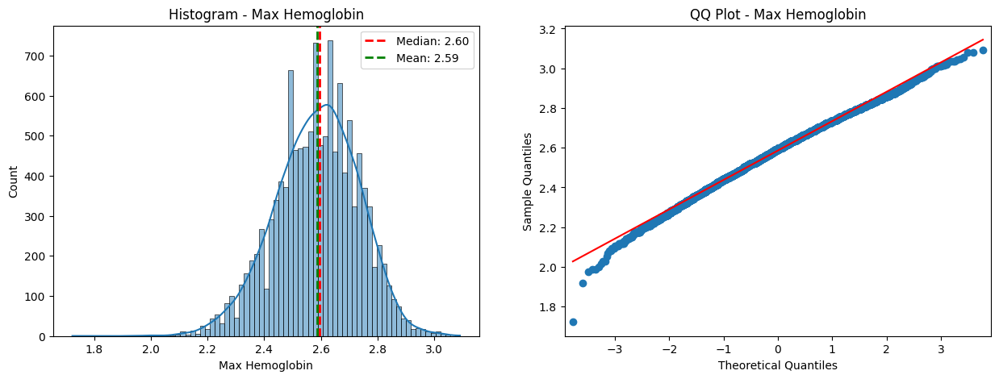

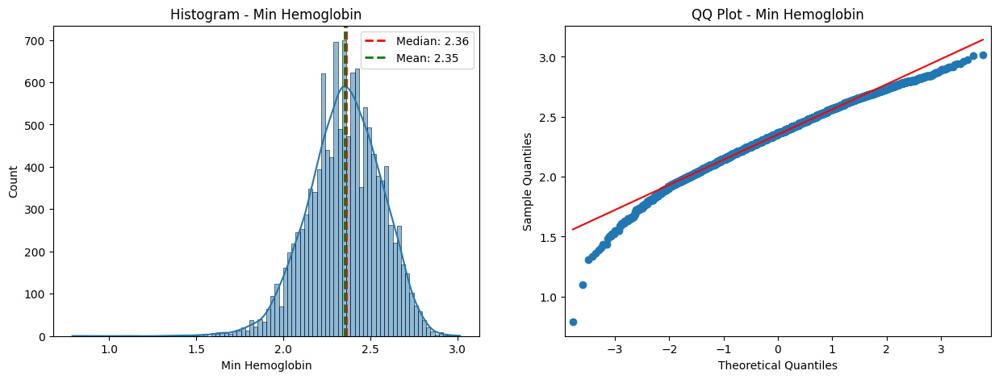

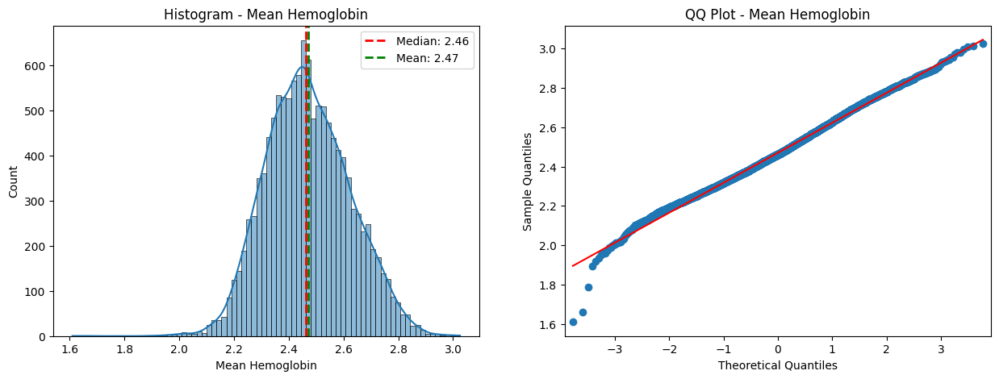

In [ ]:
for column in log_transformed_data.columns:
    if column != 'Hospital Mortality':
        plot_histogram_qqplot(log_transformed_data, column)

**Observations:**
- After the Log Transformation the variables Max Heart Rate, Mean Heart Rate, Mean MAP, Mean Systolic Pressure, Mean Diastolic Pressure, Mean BUN, Max Haemoglobin, Mean Haemoglobin were identified to have a normal distribution.

- We performed the Levene Test for homogeneity to identify the suitable parametric test that should be performed on these variables.

##### **Check: Shapiro Wilk Test After Log Transformation**

In [ ]:
# Perform Shapiro-Wilk test on each column in log_transformed_data
for column in log_transformed_data.columns[1:]:
    stat, p = stats.shapiro(log_transformed_data[column])
    print(f"Shapiro-Wilk test for {column}:")
    print(f"  Statistic: {stat}")
    print(f"  p-value: {p}")
    print("")

    if p < 0.05:
        print(f"The {column} does not follow normal distribution")
        print("---------------------------------------------------------------------")
    else:
        print(f"The {column}follows normal distribution")
        print("---------------------------------------------------------------------")

Shapiro-Wilk test for Age:
  Statistic: 0.8753691911697388
  p-value: 0.0

The Age does not follow normal distribution
---------------------------------------------------------------------
Shapiro-Wilk test for Max Heart Rate:
  Statistic: 0.9981642365455627
  p-value: 4.8528583929119407e-11

The Max Heart Rate does not follow normal distribution
---------------------------------------------------------------------
Shapiro-Wilk test for Min Heart Rate:
  Statistic: 0.8807404041290283
  p-value: 0.0

The Min Heart Rate does not follow normal distribution
---------------------------------------------------------------------
Shapiro-Wilk test for Mean Heart Rate:
  Statistic: 0.9987273216247559
  p-value: 2.0667322075951233e-08

The Mean Heart Rate does not follow normal distribution
---------------------------------------------------------------------
Shapiro-Wilk test for Max MAP:
  Statistic: 0.8827296495437622
  p-value: 0.0

The Max MAP does not follow normal distribution
-----------

/usr/local/lib/python3.10/dist-packages/scipy/stats/_morestats.py:1882: UserWarning: p-value may not be accurate for N > 5000.
  warnings.warn("p-value may not be accurate for N > 5000.")


**Observations:**

- Applied Shapiro Wilk test on the normalized data using log transformation. The result still shows that the data are not normally distruted however visual inspection tells us otherwise

**Observations:**
- Out of all the methods above, we will choose log transformation as we can observe that few variables have attained a normal distribution after data cleaning and applying normalization using log transformation
- In the case of Max Heart Rate, Mean Heart Rate, Max Systolic Pressure, Max Hemoglobin and Mean Hemoglobin, we were able to achieve distributions that closely resemble a normal distribution.  
- For the remaining variables, there was still significant deviation from the normal distribution.

### **Check for Homogeneity of variances**

 **Homogeneity of variances: F-Test (Two groups) / Levene Test (Two or more groups)**

**Levene test For Homogeneity:**

- To test the assumption of homogeneity of variance, Levene’s test is used.  
- Levene's test is used to asses if the groups have equal variances.

**Assumptions:**
- The samples from the populations under consideration are independent.
- The populations under consideration are approximately normally distributed.


**Hypothesis**

*  ***H0: the variances of groups are equal***
*   ***H1: the variances of groups are NOT equal***




**st.levene(sample1, sample2, center=’mean’)**

The center parameter can take 3 different values, namely -

- median: Recommended for skewed (non-normal) distributions.
- mean : Recommended for symmetric, moderate-tailed distributions.
- trimmed : Recommended for heavy-tailed distributions.

All columns return p value less than 0.05. This mean the variances of groups are NOT equal.

In [ ]:
# Conduct a levene test on cont_all_df to test homogeneity of variances.

# Extract the numeric columns
numeric_cols = cont_all_df.select_dtypes(include=['int64', 'float64']).columns
# print(len(numeric_cols))

# Initialize empty lists to store results
levene_results = []

# Loop through each numeric column
for col in numeric_cols:
    # Perform Levene's test
    levene_statistic, levene_pvalue = stats.levene(cont_all_df[col][cont_all_df['Hospital Mortality'] == 0], cont_all_df[col][cont_all_df['Hospital Mortality'] == 1])

    # Store the results
    if levene_pvalue > 0.05:
      levene_results.append({'Variable': col, 'Levene Statistic': levene_statistic, 'Levene p-value': levene_pvalue, 'Homogeneity': 'Yes'})
    else:
      levene_results.append({'Variable': col, 'Levene Statistic': levene_statistic, 'Levene p-value': levene_pvalue, 'Homogeneity': 'No'})

# Create a DataFrame to display the results
levene_df = pd.DataFrame(levene_results)

# Print the DataFrame
print(levene_df.to_string())


/usr/local/lib/python3.10/dist-packages/scipy/stats/_morestats.py:3189: RuntimeWarning: invalid value encountered in scalar divide
  W = numer / denom


38
                   Variable  Levene Statistic  Levene p-value Homogeneity
0        Hospital Mortality               NaN             NaN          No
1                       Age          9.766476    1.781301e-03          No
2            Max Heart Rate        228.954740    2.867679e-51          No
3            Min Heart Rate        381.172645    1.214381e-83          No
4           Mean Heart Rate        242.538863    3.550201e-54          No
5                   Max MAP         51.127977    9.135754e-13          No
6                   Min MAP        280.885248    2.308827e-62          No
7                  Mean MAP        128.331355    1.324610e-29          No
8     Max Systolic Pressure        151.111596    1.568772e-34          No
9     Min Systolic Pressure        309.132049    2.244147e-68          No
10   Mean Systolic Pressure        225.880693    1.306078e-50          No
11   Max Diastolic Pressure         67.658065    2.136216e-16          No
12   Min Diastolic Pressure        

**Observations:**
- We can observe that none of the variables pass the homogeneity test that means the variance in the two groups are not equal.
- Hence, since this fails for performing ttest

### **Statistical Tests - Continuous Variables**

In [ ]:
# Create an empty dictionary to store results assuming not normal distribution
result_dict = {'Variable': [], 'Data_Type': [], 'Type_of_Test': [], 'P-value': []}

In [ ]:
cont_all_df.columns

Index(['Hospital Mortality', 'Age', 'Max Heart Rate', 'Min Heart Rate',
       'Mean Heart Rate', 'Max MAP', 'Min MAP', 'Mean MAP',
       'Max Systolic Pressure', 'Min Systolic Pressure',
       'Mean Systolic Pressure', 'Max Diastolic Pressure',
       'Min Diastolic Pressure', 'Mean Diastolic Pressure', 'Max Temperature',
       'Min Temperature', 'Mean Temperature', 'Max Lactate', 'Min Lactate',
       'Mean Lactate', 'Max pH', 'Min pH', 'Mean pH', 'Max Glucose',
       'Min Glucose', 'Mean Glucose', 'Max WBC', 'Min WBC', 'Mean WBC',
       'Max BUN', 'Min BUN', 'Mean BUN', 'Max Creatinine', 'Min Creatinine',
       'Mean Creatinine', 'Max Hemoglobin', 'Min Hemoglobin',
       'Mean Hemoglobin'],
      dtype='object')

#### **T - Test**

**Types of t-test:**


-----------
**Paired t-test/ Dependent Samples t-test/ Paired group t-test:**

- Num of variables: 2
- Purpose: Decide if the difference between paired measurements for a population is zero or not
- Example:  Mean difference in heart rate for a group of people before and after exercise is zero or not
- Estimate of population mean: Sample average of the differences in paired measurements

**Unpaired t-test/ Two Sample t-test/ Independent groups t-test/ Equal Variance t-test/ Pooled t-test**

- Num of variables: 2
- Purpose: Decide if the population means for two different groups are equal or no
- Example: Mean heart rates for two groups of people are the same or not
- Estimate of population mean: 	Sample average for each group

**One Sample t-test/ Students t-test**

- Num of variables: 1
- Purpose: Decide if the population mean is equal to a specific value or not
- Example: Mean heart rate of a group of people is equal to 65 or not
- Estimate of population mean: 	Sample average


H0: the mean between two samples are equal .
H1: the mean between two samples are not equal.


**Note: If we use the dataset without the missing values, majority of results for the ttest are statistically significant. However, since the data are not normally distributed, we will use a nonpametric test.**

---
**Assumptions of independent t-test**
- [x] Independence of the observations. Each subject should belong to only one group. There is no relationship between the observations in each group.
- [ ] No significant outliers in the two groups
- [ ] Normality. the data for each group should be approximately normally distributed. (Central Limit Theorem)
- [ ] Homogeneity of variances. the variance of the outcome variable should be equal in each group. Recall that, the Welch t-test does not make this assumptions.

**Note**:
- We have already checked the normality above using 3 tests and found the only few variables have attained normality after log transformation while others doesnot follow normal distribution
- Since we identified from the Levene Test that none of variables have equal variances among the two groups of mortality, we decided to perform the Welch’s t-test as it is used to compare the means of two independent groups when the assumption of equal population variances is violated.  
- Due to this, 2/4 assumption have been passed for performing t-test
- For Welch test, 3/3 assumptions have been passed, so we would use it for the continous variables.

### **Welch's test**

- We decided to use the Welch's t-test on the variables Max Heart Rate, Mean Heart Rate, Mean MAP, Mean Systolic Pressure, Mean Diastolic Pressure, Mean BUN, Max Haemoglobin, Mean Haemoglobin as they followed a normal distribution closely after the Log Transformation.

**Note the data after Log Transformation were used in performing Welch's t Test.**  

The below assumptions were met by the variables.  

- Independence of the observations. Each subject should belong to only one group

- No significant outliers in the two groups

- Normality. the data for each group should be approximately normally distributed.

    - ***H0 = The means for the two groups of mortality are equal.***

    - ***Ha = The means for the two groups of mortality are not equal.***

    - α = 0.05

In [ ]:
tranformed_log = log_transformed_data.copy()
welch_data = tranformed_log[['Hospital Mortality', 'Max Heart Rate', 'Mean Heart Rate', 'Mean MAP', 'Mean Systolic Pressure', 'Mean Diastolic Pressure', 'Mean BUN', 'Max Hemoglobin', 'Mean Hemoglobin']]


In [ ]:
tranformed_log['Hospital Mortality'].value_counts()

0    10331
1     2158
Name: Hospital Mortality, dtype: int64

In [ ]:
# prompt: perform a welch's t-test on cont_all_df ['Hospital Mortality'] == 0 and cont_all_df ['Hospital Mortality'] == 1

for column in welch_data.columns[1:]:
    t_statistic, p_value = stats.ttest_ind(welch_data[column][welch_data['Hospital Mortality'] == 0], welch_data[column][welch_data['Hospital Mortality'] == 1], equal_var=False)
    print(column)
    # Print or use the results as needed
    print(f"Welch's T-test for {column}:")
    print(f"  T-statistic: {t_statistic}")
    print(f"  P-value: {p_value}")
    print("")

    if p_value < 0.05:
        print(f"The difference in {column} between survivors and non-survivors is statistically significant.")
        print("---------------------------------------------------------------------")
    else:
        print(f"There is no significant difference in {column} between survivors and non-survivors.")
        print("---------------------------------------------------------------------")

    result_dict['Variable'].append(column)
    result_dict['Data_Type'].append('Continuous')
    result_dict['Type_of_Test'].append('Welch\'s T-test')
    result_dict['P-value'].append(p_value)



Max Heart Rate
Welch's T-test for Max Heart Rate:
  T-statistic: -14.425352999038484
  P-value: 1.5137029803818268e-45

The difference in Max Heart Rate between survivors and non-survivors is statistically significant.
---------------------------------------------------------------------
Mean Heart Rate
Welch's T-test for Mean Heart Rate:
  T-statistic: -9.820534110448351
  P-value: 2.1132933705136722e-22

The difference in Mean Heart Rate between survivors and non-survivors is statistically significant.
---------------------------------------------------------------------
Mean MAP
Welch's T-test for Mean MAP:
  T-statistic: 9.963466996165206
  P-value: 5.409360708044105e-23

The difference in Mean MAP between survivors and non-survivors is statistically significant.
---------------------------------------------------------------------
Mean Systolic Pressure
Welch's T-test for Mean Systolic Pressure:
  T-statistic: 11.317210031572678
  P-value: 4.935026168815372e-29

The difference in 

**Observation:**
- Based on the summary table of results above we can see the p values of Max Heart Rate, Mean Heart Rate, Mean MAP, Mean Systolic Pressure, Mean Diastolic Pressure, Mean BUN and Mean Hemoglobin are less than 0.05 level, concluding the difference between survivors and non-survivors for each variable is statistically significant.  
- However, in the variable Mean Haemoglobin the p value is greater than 0.05 level, where we accept the null hypothesis concluding the means of survivors and non-survivors are equal.  

### **Mann-Whitney U test**

- Since the shape of the distribution for the remaining continuous variables are not normal, we decided to use a non-parametric test called the Mann-Whitney on the dataset before log transformation. Note that all assumptions listed below are met.  


**Assumptions:**

- Observations in each group are independent of each other.  
- Random sampling is assumed.  
- The variables are ordinal or interval.  
- Shapes of the distributions in the two groups are similar.  

***H0 = The distributions of the living group are equal to the distributions of the deceased group.***

***Ha = There is a difference between the distributions of the two groups.***

In [ ]:
columns_to_exclude = ['Mean Heart Rate', 'Max Heart Rate','Mean MAP', 'Mean Systolic Pressure', 'Mean Diastolic Pressure', 'Mean BUN', 'Max Hemoglobin', 'Mean Hemoglobin']

# Dropping the specified columns
mann_cont_data = cont_all_df.drop(columns=columns_to_exclude)

In [ ]:
# Separate data into two groups based on target
survivors = mann_cont_data[mann_cont_data['Hospital Mortality'] == 0]
non_survivors = mann_cont_data[mann_cont_data['Hospital Mortality'] == 1]

# Perform Mann-Whitney U test for each numerical column
for column in mann_cont_data.columns[1:]:
    stat, p = stats.mannwhitneyu(survivors[column], non_survivors[column])
    print(column)
    # Print or use the results as needed
    print(f"Mann-Whitney U test for {column}:")
    print(f"  Statistic: {stat}")
    print(f"  P-value: {p}")
    print("")

    if p < 0.05:
        print(f"The difference in {column} between survivors and non-survivors is statistically significant.")
        print("---------------------------------------------------------------------")
    else:
        print(f"There is no significant difference in {column} between survivors and non-survivors.")
        print("---------------------------------------------------------------------")

    # Append results to the dictionary
    result_dict['Variable'].append(column)
    result_dict['Data_Type'].append('Continuous')
    result_dict['Type_of_Test'].append('Mann-Whitney U')
    result_dict['P-value'].append(p)


Age
Mann-Whitney U test for Age:
  Statistic: 8525675.5
  P-value: 2.1525320528626538e-66

The difference in Age between survivors and non-survivors is statistically significant.
---------------------------------------------------------------------
Min Heart Rate
Mann-Whitney U test for Min Heart Rate:
  Statistic: 11076044.0
  P-value: 0.6405817553911917

There is no significant difference in Min Heart Rate between survivors and non-survivors.
---------------------------------------------------------------------
Max MAP
Mann-Whitney U test for Max MAP:
  Statistic: 11096635.5
  P-value: 0.7401547602044709

There is no significant difference in Max MAP between survivors and non-survivors.
---------------------------------------------------------------------
Min MAP
Mann-Whitney U test for Min MAP:
  Statistic: 14278470.0
  P-value: 5.902742296218549e-94

The difference in Min MAP between survivors and non-survivors is statistically significant.
-----------------------------------------

**Observation:**
- Based on the summary table only Min Heart Rate, Max MAP, Max Systolic Pressure and Max Diastolic Pressure have a p-value of > 0.05. For the said variables, we can assume that the distributions of the living group are equal to the distributions of the deceased group.
- For the rest of the variables, results show that there is a difference between the distributions of the two groups.

The following Mann-Whitney test is conducted for the variables that became normally dristributed after doing the log transformation. We created this subset to compare the result with the Welch T-Test results.

In [ ]:
subset_welch = cont_all_df.copy()
MW_comparison = subset_welch[['Hospital Mortality', 'Max Heart Rate', 'Mean Heart Rate', 'Mean MAP', 'Mean Systolic Pressure', 'Mean Diastolic Pressure', 'Mean BUN', 'Max Hemoglobin', 'Mean Hemoglobin']]

# Separate data into two groups based on target
survivors = MW_comparison[MW_comparison['Hospital Mortality'] == 0]
non_survivors = MW_comparison[MW_comparison['Hospital Mortality'] == 1]

# Perform Mann-Whitney U test for each numerical column
for column in MW_comparison.columns[1:]:
    stat, p = stats.mannwhitneyu(survivors[column], non_survivors[column])
    print(column)
    # Print or use the results as needed
    print(f"Mann-Whitney U test for {column}:")
    print(f"  Statistic: {stat}")
    print(f"  P-value: {p}")
    print("")

    if p < 0.05:
        print(f"The difference in {column} between survivors and non-survivors is statistically significant.")
        print("---------------------------------------------------------------------")
    else:
        print(f"There is no significant difference in {column} between survivors and non-survivors.")
        print("---------------------------------------------------------------------")

Max Heart Rate
Mann-Whitney U test for Max Heart Rate:
  Statistic: 8640638.5
  P-value: 7.524132792815273e-61

The difference in Max Heart Rate between survivors and non-survivors is statistically significant.
---------------------------------------------------------------------
Mean Heart Rate
Mann-Whitney U test for Mean Heart Rate:
  Statistic: 9409815.0
  P-value: 3.947274866302104e-30

The difference in Mean Heart Rate between survivors and non-survivors is statistically significant.
---------------------------------------------------------------------
Mean MAP
Mann-Whitney U test for Mean MAP:
  Statistic: 12733640.5
  P-value: 2.1228661641088843e-25

The difference in Mean MAP between survivors and non-survivors is statistically significant.
---------------------------------------------------------------------
Mean Systolic Pressure
Mann-Whitney U test for Mean Systolic Pressure:
  Statistic: 13073048.5
  P-value: 1.224837336030013e-36

The difference in Mean Systolic Pressure 

**Observation:**

**Comparison of Mann Whitney & Welch T test**

- We performed	the Mann Whitney U test for the same variables (Max Heart Rate, Mean Heart Rate, Mean MAP, Mean Systolic Pressure, Mean Diastolic Pressure, Mean BUN, Max Haemoglobin, Mean Haemoglobin) that Welch T test was performed, to compare the results from two different tests. The null and alternative hypothesis were same as above with the α = 0.05.

- Considering the above results obtained from the Mann-Whitney test, we can observe that it leads to the similar conclusion derived from the Welch t-test discussed earlier.  

- For the Mean Haemoglobin the means of survivors and non -survivors are equal, whereas for the other variables the means are statistically significant between survivors and non-survivors.

### **Relationship of Continuous variables**

#### **Spearman Correlation**

The below correlation matrix illustrates the pair of variables per group that exhibit a moderate to strong positive or negative correlation according to Spearman correlation coefficient.



**Spearman Correlation Assumption:**

- The variables are either ordinal or continuous data that follow a monotonic relationship.  

  - ***H0: There is no monotonic association between the two variables.***

  - ***Ha: There is a monotonic association between the two variables.***

With the significance level at 0.05, the results are statistically significant.

In [ ]:
# Create an empty dictionary to store the correlation results
corr_results_cont = {'Variable_1': [], 'Variable_2': [], 'Test': [],'Correlation': [], 'P_Value': [], 'Group': []}
cols_to_exclude_s = [col for col in cont_all_df.columns if 'Min_x' in col or 'Max_x' in col]
spearman_matrix = cont_all_df.drop(cols_to_exclude_s, axis=1)

# Iterate over the ordinal variables, excluding 'Hospital Mortality'
for col1 in spearman_matrix.columns[1:-1]:
    for col2 in spearman_matrix.columns[2:]:
        if col1 != col2:
            # Separate data into two groups based on target
            survivors = spearman_matrix[spearman_matrix['Hospital Mortality'] == 0]
            non_survivors = spearman_matrix[spearman_matrix['Hospital Mortality'] == 1]

            # Calculate Spearman's correlation coefficient and p-value for each group
            corr_survivors, p_survivors = stats.spearmanr(survivors[col1], survivors[col2])
            corr_non_survivors, p_non_survivors = stats.spearmanr(non_survivors[col1], non_survivors[col2])

            # Store the results
            corr_results_cont['Variable_1'].append(col1)
            corr_results_cont['Variable_2'].append(col2)
            corr_results_cont['Correlation'].append(corr_survivors)
            corr_results_cont['P_Value'].append(p_survivors)
            corr_results_cont['Group'].append('Survivors')
            corr_results_cont['Test'].append('Spearman')

            corr_results_cont['Variable_1'].append(col1)
            corr_results_cont['Variable_2'].append(col2)
            corr_results_cont['Correlation'].append(corr_non_survivors)
            corr_results_cont['P_Value'].append(p_non_survivors)
            corr_results_cont['Group'].append('Non-Survivors')
            corr_results_cont['Test'].append('Spearman')

# Create a DataFrame from the results
corr_df_cont = pd.DataFrame(corr_results_cont)

In [ ]:
# filter by -1 to -.5 and .5 to 1

# Filter the correlation values
filtered_corr = corr_df_cont[(corr_df_cont['Correlation'] <= -0.5) | (corr_df_cont['Correlation'] >= 0.5)]
print(filtered_corr.shape)

# Sort the filtered results by Correlation in descending order
sorted_corr = filtered_corr.sort_values(by='Correlation', ascending=False)

sorted_corr['Correlation'] = sorted_corr['Correlation'].round(4)

sorted_corr['Second_Word_Variable_1'] = sorted_corr['Variable_1'].str.split().str[1]
sorted_corr['Second_Word_Variable_2'] = sorted_corr['Variable_2'].str.split().str[1]

sorted_corr = sorted_corr[sorted_corr['Second_Word_Variable_1'] != sorted_corr['Second_Word_Variable_2']]
print(sorted_corr.shape)

# Drop the helper column 'Second_Word_Variable_2'
sorted_corr = sorted_corr.drop(['Second_Word_Variable_2','Second_Word_Variable_1'], axis=1)

sorted_corr.reset_index(drop=True, inplace=True)

sorted_corr = sorted_corr[sorted_corr.index % 2 != 0]

print(sorted_corr.shape)

print(sorted_corr)



(204, 6)
(90, 8)
(45, 6)
                 Variable_1               Variable_2      Test  Correlation  \
1                  Mean MAP  Mean Diastolic Pressure  Spearman       0.8582   
3                  Mean MAP  Mean Diastolic Pressure  Spearman       0.8569   
5    Min Diastolic Pressure                  Min MAP  Spearman       0.8189   
7    Min Diastolic Pressure                  Min MAP  Spearman       0.8148   
9     Min Systolic Pressure                  Min MAP  Spearman       0.7987   
11                 Mean MAP   Mean Systolic Pressure  Spearman       0.7556   
13                  Max MAP   Max Diastolic Pressure  Spearman       0.7452   
15   Max Diastolic Pressure                  Max MAP  Spearman       0.7362   
17          Mean Creatinine                  Max BUN  Spearman       0.7351   
19          Mean Creatinine                 Mean BUN  Spearman       0.7328   
21           Min Creatinine                  Min BUN  Spearman       0.7320   
23                 Mean BUN

In [ ]:

cont_spear_df = cont_all_df[["Hospital Mortality","Mean Diastolic Pressure", "Mean Systolic Pressure", "Mean BUN", "Mean Creatinine", "Mean MAP","Max Lactate","Min pH"]]

cont_spear_df.head(5)

,Hospital Mortality,Mean Diastolic Pressure,Mean Systolic Pressure,Mean BUN,Mean Creatinine,Mean MAP,Max Lactate,Min pH
0,0,55.720000,102.960000,44.75,2.65,75.692812,8.8,7.26
1,1,79.525000,159.375000,16.50,1.30,98.850000,2.7,7.39
2,1,64.885714,128.228571,33.50,1.50,88.200000,15.1,7.02
9,1,59.923077,114.153846,12.00,0.80,79.923077,1.5,7.46
13,0,62.350000,94.300000,48.50,2.20,73.000005,2.8,7.32


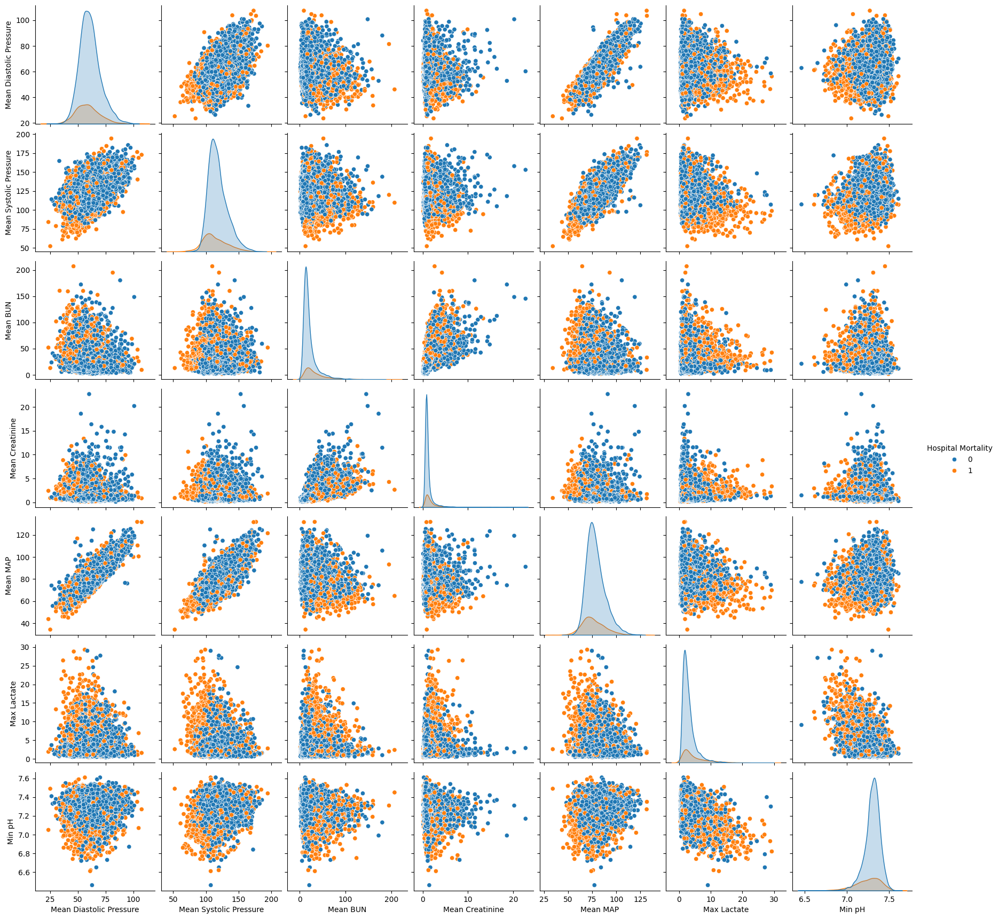

In [ ]:

import seaborn as sns

sns.pairplot(data=cont_spear_df, hue="Hospital Mortality")
plt.show()


### **Visualization**

#### **Density plots for Continuous variables**

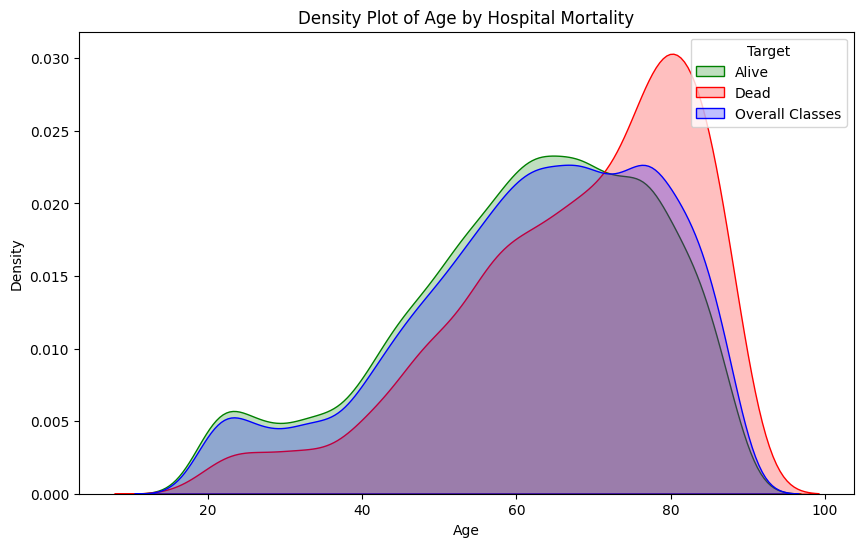

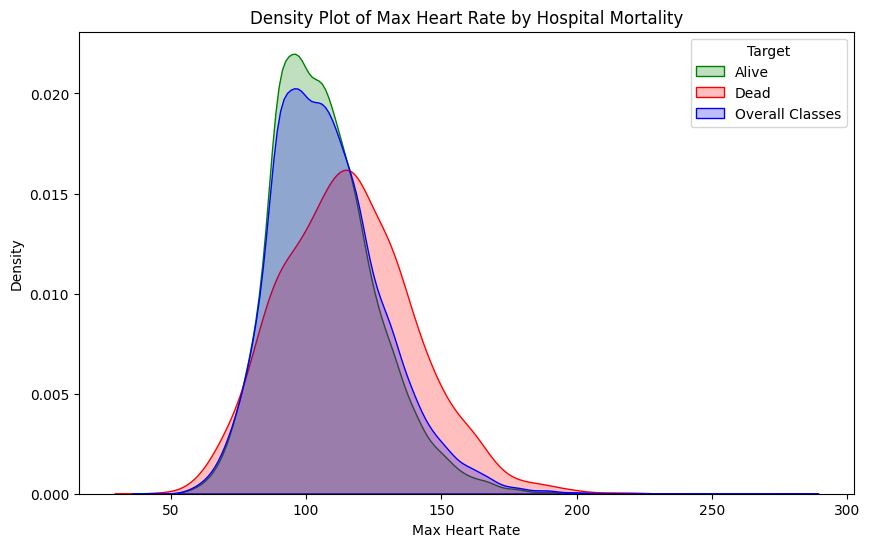

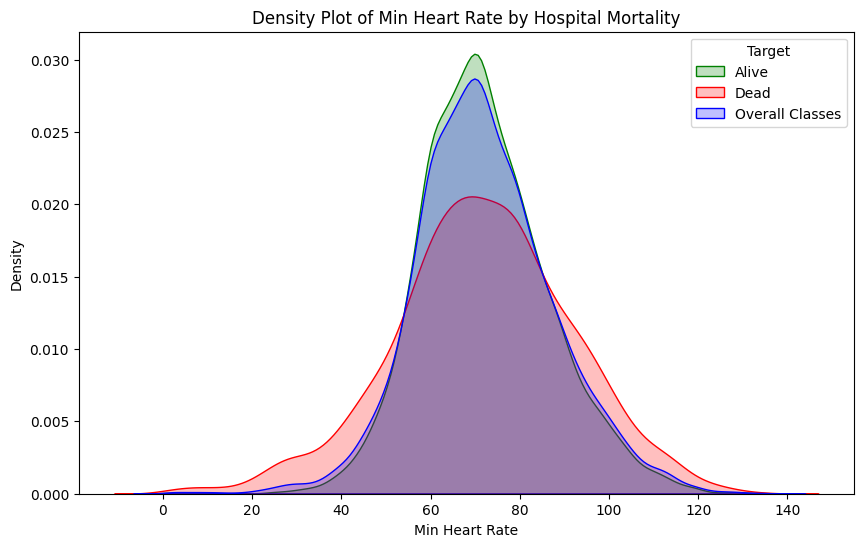

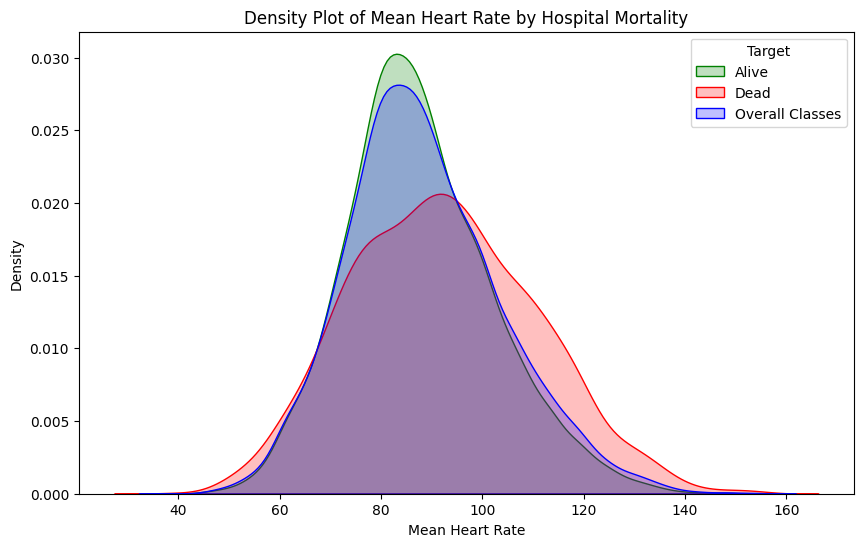

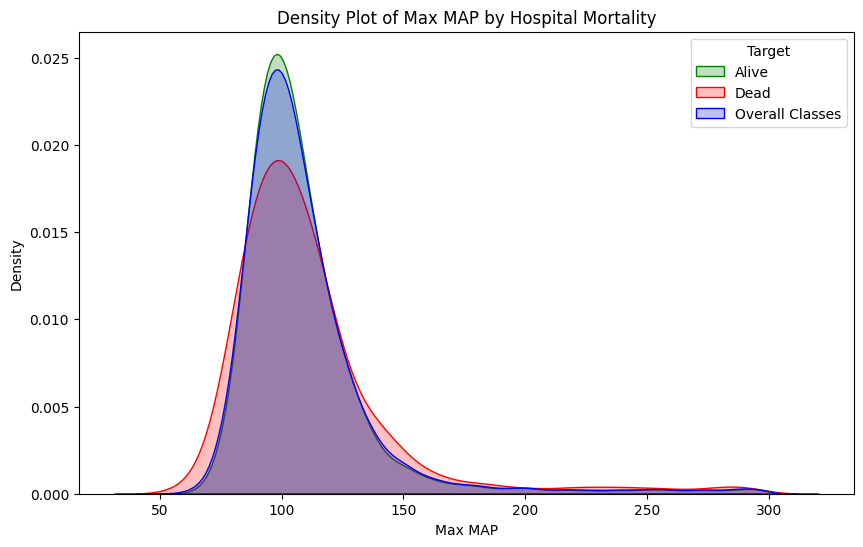

...

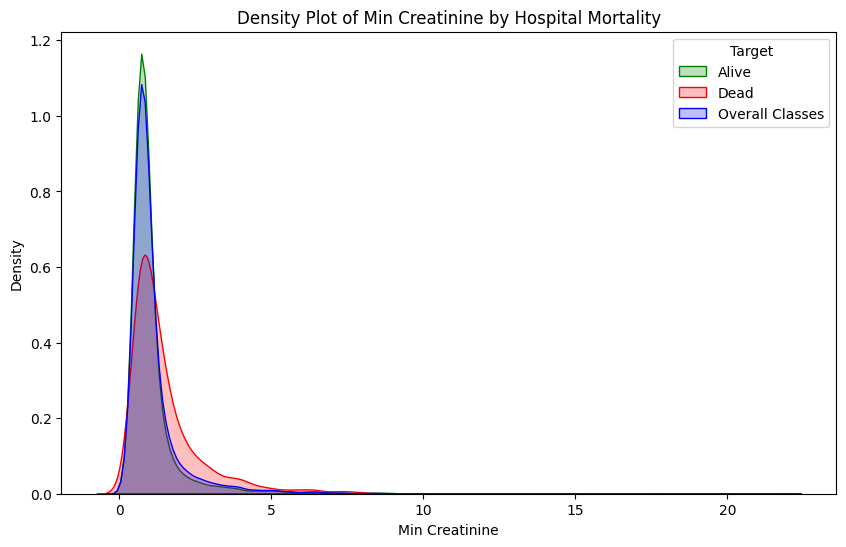

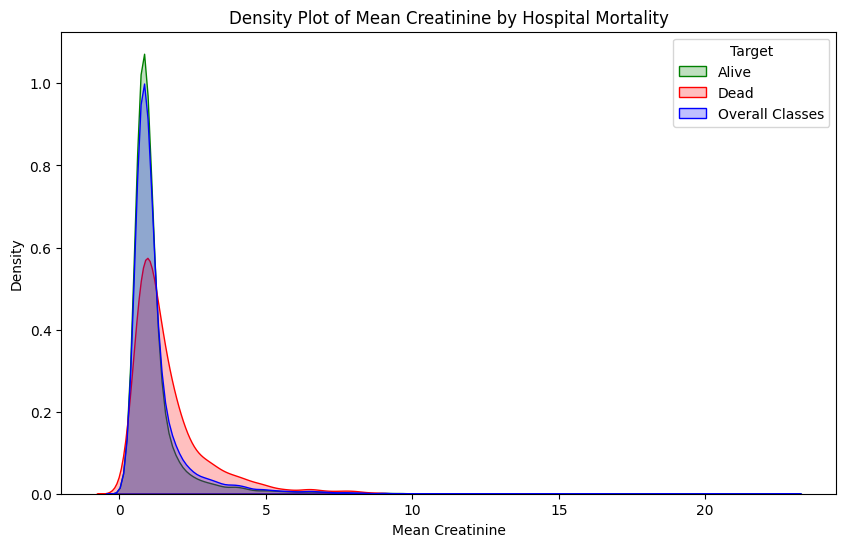

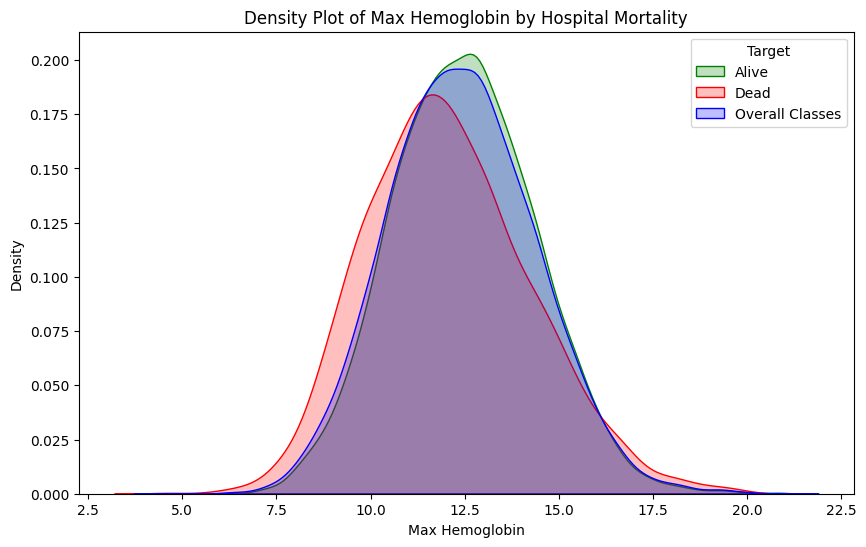

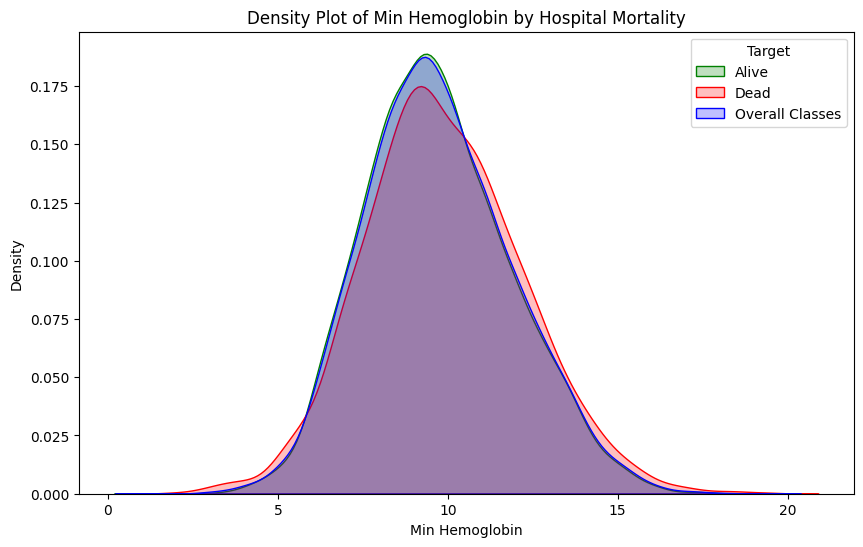

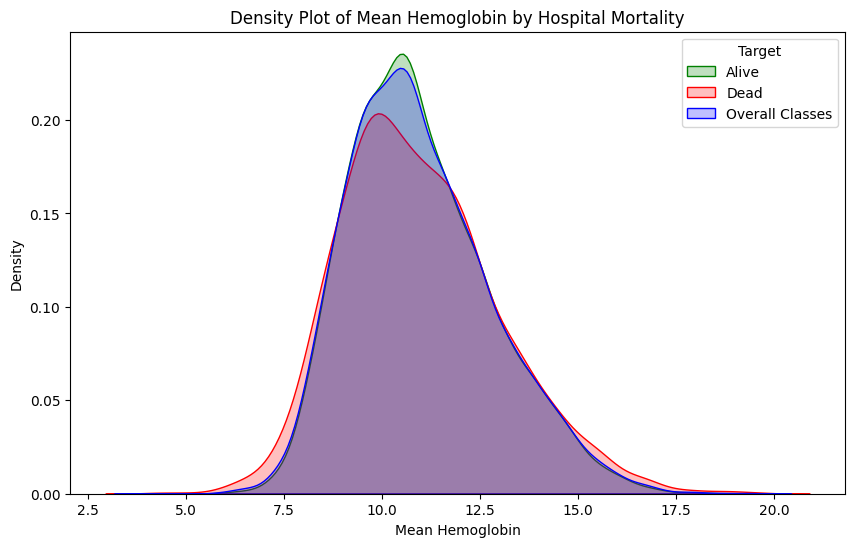

In [ ]:
# First, select the columns you want to visualize
columns_to_visualize = cont_all_df # You can customize this based on your needs

# Remove the target column from the list (we don't want to plot it against itself)
# columns_to_visualize.remove('Hospital Mortality')

# Now, let's create density plots for each column against the target variable
for column in columns_to_visualize:
  if column == 'Hospital Mortality':
    pass
  else:
    fig, ax = plt.subplots(figsize=(10, 6))
    sns.kdeplot(data=df[df['Hospital Mortality'] == 0][column], ax = ax, label='Alive', fill=True, color = 'g')
    sns.kdeplot(data=df[df['Hospital Mortality'] == 1][column], ax = ax, label='Dead', fill=True, color = 'r')
    sns.kdeplot(data=df[column], label='Overall Classes',ax = ax, fill=True,color='b')

    plt.title(f'Density Plot of {column} by Hospital Mortality')
    plt.xlabel(column)
    plt.ylabel('Density')
    plt.legend(title='Target')
    plt.show()